In [1]:
import random
from math import pi
from pathlib import Path

from PIL import Image

In [58]:
include_default_avatars = False


n_x = 20
n_y = 26

cutout_size = 128

img_x = n_x * cutout_size
img_y = n_y * cutout_size

n_cutouts = n_x*n_y
print(n_cutouts)

520


In [33]:
avatarpaths = list(Path('avatars/nondefault').glob('*'))
if include_default_avatars:
    avatarpaths.extend(list(Path('avatars/default').glob('*')))

Use a [nothing-up-my-sleeve](https://en.wikipedia.org/wiki/Nothing-up-my-sleeve_number) seed.

In [35]:
random.seed(int(pi*10000))
random.shuffle(avatarpaths)

In [59]:
avatars = [Image.open(p) for p in avatarpaths[:n_cutouts]]
resized_avatars = [a.resize((cutout_size, cutout_size)) for a in avatars]

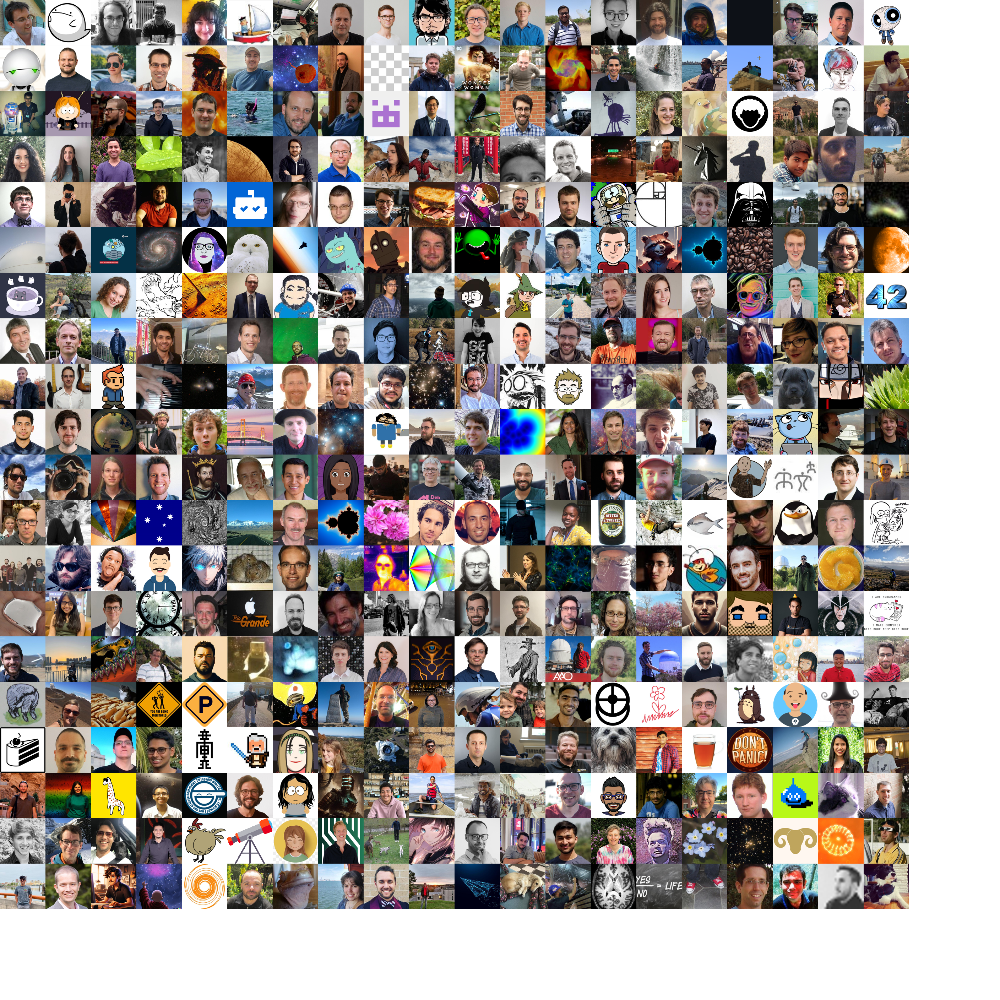

In [60]:
mosaic = Image.new(mode='RGBA', size=(image_size, image_size))
for i, a in enumerate(resized_avatars):
    x = (i%n_x)*cutout_size
    y = int(i/n_y)*cutout_size
    mosaic.paste(a, (x, y))
mosaic

In [65]:
mosaic.save('mosaic.png')